In [1]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
import re

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer

from tqdm import tqdm
tqdm.pandas() 

import nltk
nltk.download('punkt_tab')

import gensim

pd.set_option('display.max_colwidth', None)

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Darren\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [194]:
# read the three datasets and concatenate them into single dataset

dataset_1 = pd.read_csv('goemotions_1.csv')
dataset_2 = pd.read_csv('goemotions_2.csv')
dataset_3 = pd.read_csv('goemotions_3.csv')

pd.concat([dataset_1, dataset_2, dataset_3]).to_csv('goemotions.csv', index=False)

In [2]:
# read the new dataset

df = pd.read_csv('goemotions.csv')
df.head(1)

,text,id,author,subreddit,link_id,parent_id,created_utc,rater_id,example_very_unclear,admiration,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,That game hurt.,eew5j0j,Brdd9,nrl,t3_ajis4z,t1_eew18eq,1.548381e+09,1,False,0,...,0,0,0,0,0,0,0,1,0,0


In [3]:
# dropping unnecessary columns

df.drop(columns=['id', 'author', 'subreddit', 'link_id', 'parent_id', 'created_utc', 'rater_id', 'example_very_unclear'], inplace=True)
df.head()

,text,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,That game hurt.,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,">sexuality shouldn’t be a grouping category It makes you different from othet ppl so imo it fits the definition of ""grouping""",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"You do right, if you don't care then fuck 'em!",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,Man I love reddit.,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,"[NAME] was nowhere near them, he was by the Falcon.",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [4]:
# dropping missing values and duplicates
df.dropna(inplace=True)

df.drop_duplicates(inplace=True)

In [5]:
# column names
df.columns

Index(['text', 'admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise', 'neutral'],
      dtype='object')

In [6]:
# value count for each classes
class_counts = df.iloc[:, 1:].sum()

print(class_counts)

admiration        12700
amusement          6630
anger              6696
annoyance         11778
approval          14887
caring             5078
confusion          6107
curiosity          7546
desire             3242
disappointment     7600
disapproval        9504
disgust            4642
embarrassment      2208
excitement         4940
fear               2643
gratitude          7770
grief               621
joy                6808
love               5809
nervousness        1676
optimism           7253
pride              1217
realization        7827
relief             1162
remorse            2071
sadness            5685
surprise           4528
neutral           31446
dtype: int64


In [200]:
df.head()

,text,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,That game hurt.,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,">sexuality shouldn’t be a grouping category It makes you different from othet ppl so imo it fits the definition of ""grouping""",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"You do right, if you don't care then fuck 'em!",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,Man I love reddit.,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,"[NAME] was nowhere near them, he was by the Falcon.",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [201]:
class_counts = df.iloc[:, 1:].sum()

print(class_counts)

admiration        12700
amusement          6630
anger              6696
annoyance         11778
approval          14887
caring             5078
confusion          6107
curiosity          7546
desire             3242
disappointment     7600
disapproval        9504
disgust            4642
embarrassment      2208
excitement         4940
fear               2643
gratitude          7770
grief               621
joy                6808
love               5809
nervousness        1676
optimism           7253
pride              1217
realization        7827
relief             1162
remorse            2071
sadness            5685
surprise           4528
neutral           31446
dtype: int64


In [202]:
import re

def remove_bracket_and_slash_words(text):
    # remove words surrounded by square brackets ([TEXT], [NAME])
    text = re.sub(r'\[.*?\]', '', text)
    
    # remove words that start with slash (/jk, /e)
    text = re.sub(r'\/\w+', '', text)
    
    # remove extra spaces
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

In [203]:
# apply the function to the text column
df['text'] = df['text'].progress_apply(remove_bracket_and_slash_words)
df.head()

100%|██████████| 154135/154135 [00:00<00:00, 226188.35it/s]


,text,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,That game hurt.,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,">sexuality shouldn’t be a grouping category It makes you different from othet ppl so imo it fits the definition of ""grouping""",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"You do right, if you don't care then fuck 'em!",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,Man I love reddit.,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,"was nowhere near them, he was by the Falcon.",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [204]:
df['text'] = df['text'].progress_apply(gensim.utils.simple_preprocess)
df.head()

100%|██████████| 154135/154135 [00:02<00:00, 52142.90it/s]


,text,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
0,"[that, game, hurt]",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,"[sexuality, shouldn, be, grouping, category, it, makes, you, different, from, othet, ppl, so, imo, it, fits, the, definition, of, grouping]",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,"[you, do, right, if, you, don, care, then, fuck, em]",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,"[man, love, reddit]",0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,"[was, nowhere, near, them, he, was, by, the, falcon]",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


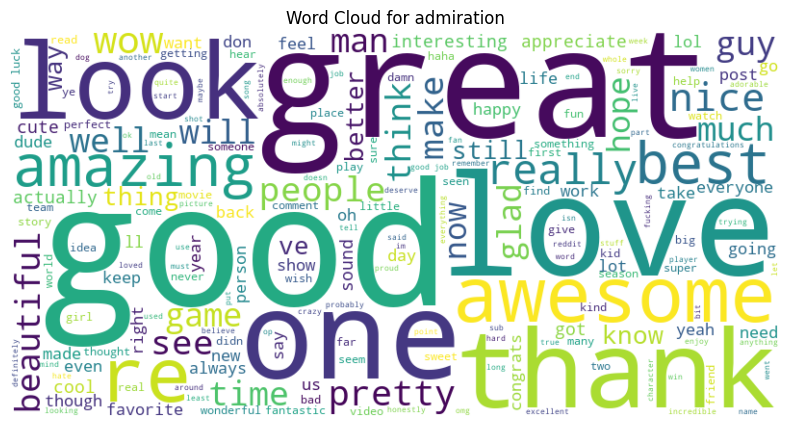

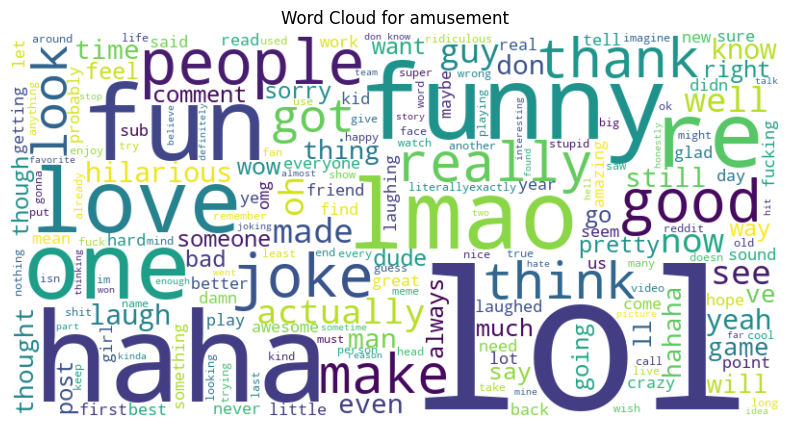

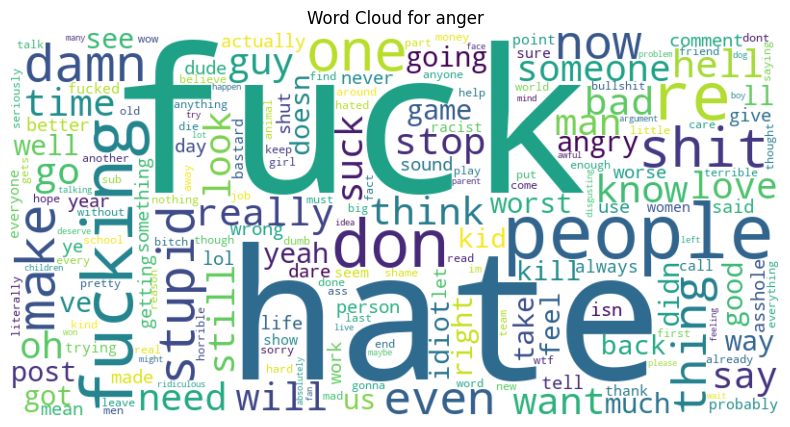

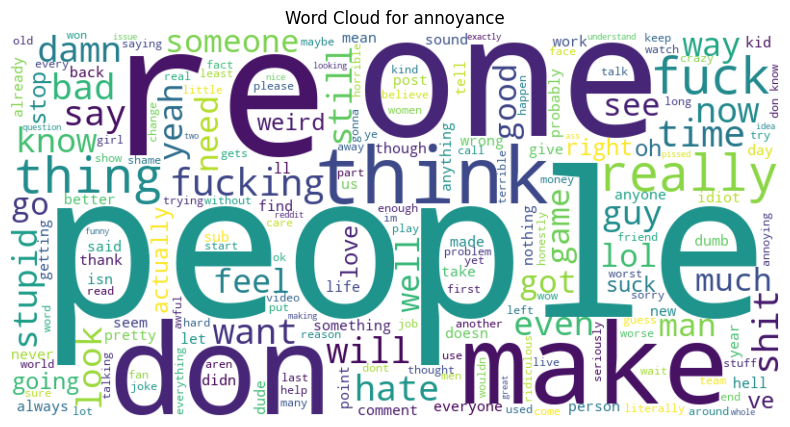

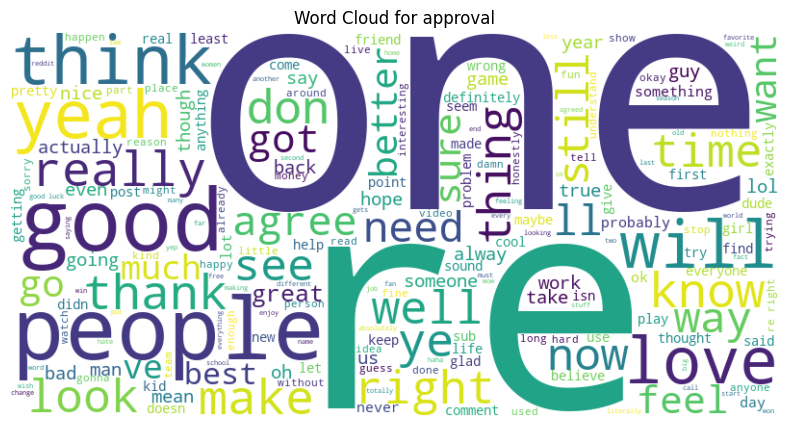

...

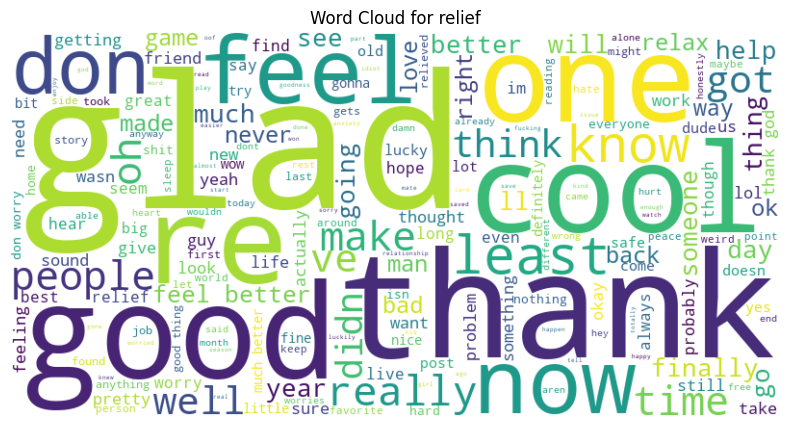

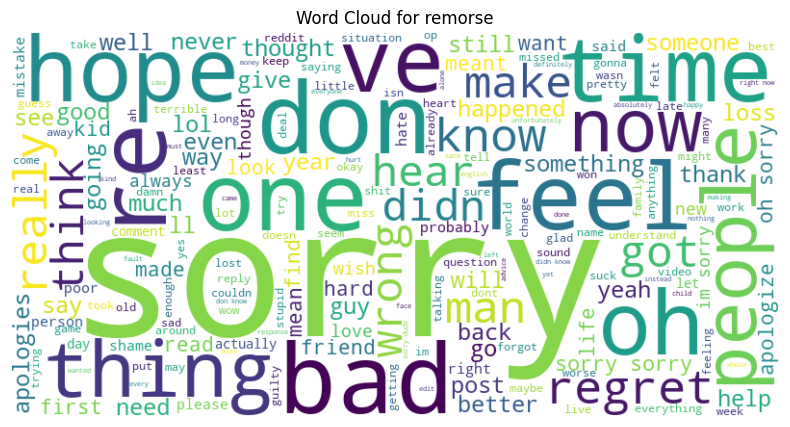

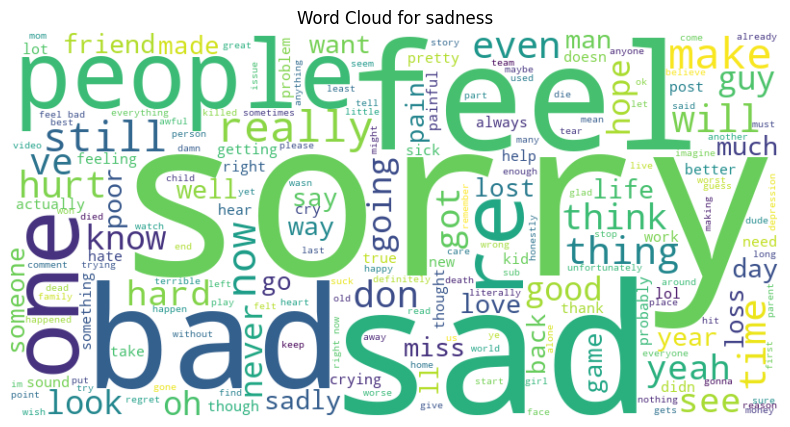

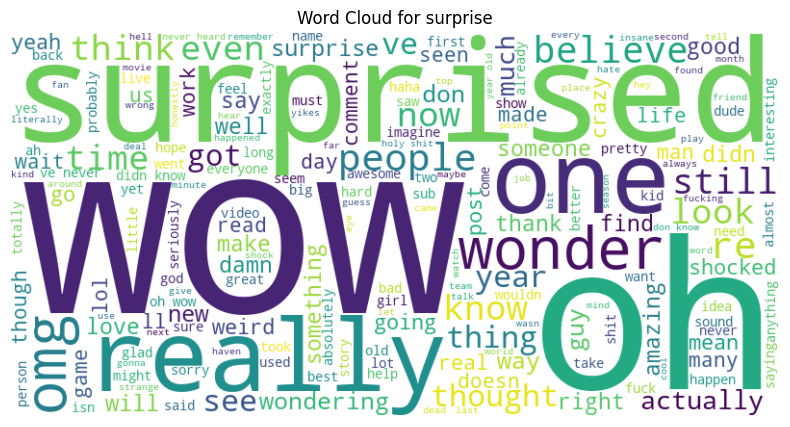

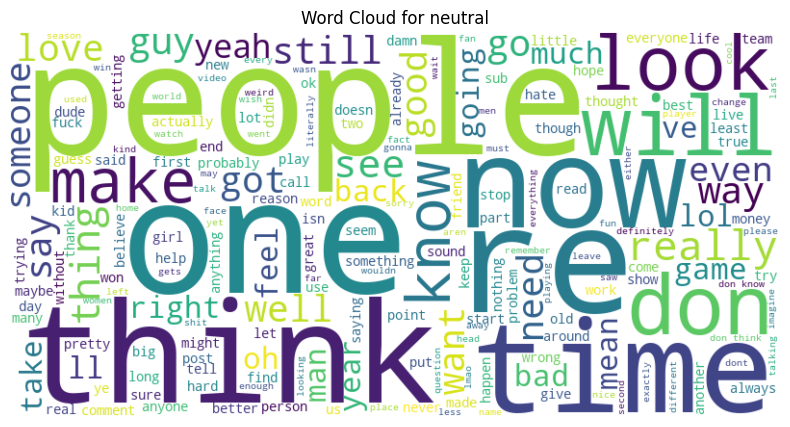

In [205]:
def generate_wordcloud(text_data, class_name):
    # combining all text entries into a single string
    combined_text = ' '.join(text_data)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(combined_text)
    
    # display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {class_name}")
    plt.show()

for class_name in df.columns[1:]:
    class_text = df[df[class_name] == 1]['text'].apply(lambda x: ' '.join(x))
    generate_wordcloud(class_text, class_name)

In [206]:
# analyze the findings
# The word clouds show the most common words used in each class.
# The word cloud for "admiration" shows words like "love", "good", "great", "awesome"
# The word cloud for "amusement" shows words like "funny", "haha", "lol", "lmao"
# The word cloud for "anger" shows words like "hate", "fuck"
# The word cloud for "annoyance" shows words like "people", "make"
# The word cloud for "approval" shows words like "one", "people"
# The word cloud for "caring" shows words like "hope", "good", "love", "will"
# The word cloud for "confusion" shows words like "maybe", "sure", "really"
# The word cloud for "curiosity" shows words like "know", "one", "people"
# The word cloud for "desire" shows words like "wish", "want", "need"
# The word cloud for "disappointment" shows words like "bad", "one"
# The word cloud for "disapproval" shows words like "people", "bad", "one"
# The word cloud for "disgust" shows words like "weird", "awful", 'disgusting
# The word cloud for "embarrassment" shows words like "sorry", "shame", "bad"
# The word cloud for "excitement" shows words like "see", "wow", "love"
# The word cloud for "fear" shows words like "afraid", "terrible", "scared"
# The word cloud for "gratitude" shows words like "thank", "glad", "great"
# The word cloud for "grief" shows words like "sorry", "died", "death"
# The word cloud for "joy" shows words like "happy", "glad", "good"
# The word cloud for "love" shows words like "love", "loved", "good"
# The word cloud for "nervousness" shows words like "make", "worried", "people"
# The word cloud for "optimism" shows words like "hope", "good", "will"
# The word cloud for "pride" shows words like "proud", "glad", "good"
# The word cloud for "realization" shows words like "think", "now", "know"
# The word cloud for "relief" shows words like "glad", "thank", "good"
# The word cloud for "remorse" shows words like "sorry", "bad", "regret"
# The word cloud for "sadness" shows words like "sorry", "sad", "feel"
# The word cloud for "surprise" shows words like "surprised", "wow", "oh"

# Some classes like annoyance, approval, curiosity, disappointment, disapproval doesnt have any specific words that are common among them.
# "one", "re", "people" appeared in so many classes, so we might need to do more preprocesssing to remove these common words. 

In [210]:
# join the tokenized text into a single string
df['text'] = df['text'].apply(lambda x: ' '.join(x))

In [211]:
df['text'].head()

0                                                                                                            that game hurt
1    sexuality shouldn be grouping category it makes you different from othet ppl so imo it fits the definition of grouping
2                                                                                 you do right if you don care then fuck em
3                                                                                                           man love reddit
4                                                                                was nowhere near them he was by the falcon
Name: text, dtype: object

In [212]:
# convert text into vectors using tf-idf vectorizer
vectorizer = TfidfVectorizer()

X = vectorizer.fit_transform(df['text'])
y = df.iloc[:, 1:]

In [213]:
# splitting data into train, test, val
x_train, x_temp, y_train, y_temp = train_test_split(X, y, train_size=0.8, random_state=42)
x_test, x_val, y_test, y_val = train_test_split(x_temp, y_temp, train_size=0.5, random_state=42)